In [32]:
import os
import gc
import time

import numpy as np
import pandas as pd
import statsmodels.api as sm

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from cachetools import cached, LRUCache

import warnings
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format
warnings.filterwarnings('ignore')

In [2]:
# Import
train = pd.read_csv("../data/train.csv")
test = pd.read_csv("../data//test.csv")
stores = pd.read_csv("../data//stores.csv")
transactions = pd.read_csv("../data//transactions.csv").sort_values(["store_nbr", "date"])
holidays_events = pd.read_csv("../data//holidays_events.csv")
#sub = pd.read_csv("../input/store-sales-time-series-forecasting/sample_submission.csv")   

In [3]:
train['date'] = pd.to_datetime(train['date'])
test['date'] = pd.to_datetime(test['date'])
transactions['date'] = pd.to_datetime(transactions['date'])
holidays_events['date'] = pd.to_datetime(holidays_events['date'])

### train data prepocessing

In [4]:
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0
1,1,2013-01-01,1,BABY CARE,0.00,0
2,2,2013-01-01,1,BEAUTY,0.00,0
3,3,2013-01-01,1,BEVERAGES,0.00,0
4,4,2013-01-01,1,BOOKS,0.00,0


In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   id           int64  
 1   date         object 
 2   store_nbr    int64  
 3   family       object 
 4   sales        float64
 5   onpromotion  int64  
dtypes: float64(1), int64(3), object(2)
memory usage: 137.4+ MB


In [6]:
train.describe()

,id,store_nbr,sales,onpromotion
count,3000888.00,3000888.00,3000888.00,3000888.00
mean,1500443.50,27.50,357.78,2.60
std,866281.89,15.59,1102.00,12.22
min,0.00,1.00,0.00,0.00
25%,750221.75,14.00,0.00,0.00
50%,1500443.50,27.50,11.00,0.00
75%,2250665.25,41.00,195.85,0.00
max,3000887.00,54.00,124717.00,741.00


In [7]:
transactions.info()

<class 'pandas.core.frame.DataFrame'>
Index: 83488 entries, 1 to 83487
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   date          83488 non-null  object
 1   store_nbr     83488 non-null  int64 
 2   transactions  83488 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 2.5+ MB


In [8]:
stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


# Preprocessing

## train preprocessing

In [5]:
train.describe()

,id,date,store_nbr,sales,onpromotion
count,3000888.00,3000888,3000888.00,3000888.00,3000888.00
mean,1500443.50,2015-04-24 08:27:04.703088384,27.50,357.78,2.60
min,0.00,2013-01-01 00:00:00,1.00,0.00,0.00
25%,750221.75,2014-02-26 18:00:00,14.00,0.00,0.00
50%,1500443.50,2015-04-24 12:00:00,27.50,11.00,0.00
75%,2250665.25,2016-06-19 06:00:00,41.00,195.85,0.00
max,3000887.00,2017-08-15 00:00:00,54.00,124717.00,741.00
std,866281.89,NaN,15.59,1102.00,12.22


In [6]:
train["date"] = pd.to_datetime(train.date)
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0
1,1,2013-01-01,1,BABY CARE,0.00,0
2,2,2013-01-01,1,BEAUTY,0.00,0
3,3,2013-01-01,1,BEVERAGES,0.00,0
4,4,2013-01-01,1,BOOKS,0.00,0


In [7]:
min_date = train['date'].min()
max_date = train['date'].max()

# 전체 기간 생성 및 비어 있는 날짜 찾기
all_dates = pd.date_range(start=min_date, end=max_date)
missing_dates = all_dates.difference(pd.to_datetime(train['date'].unique()))

print("Start Date:", min_date)
print("End Date:", max_date)
print("Missing Dates:", missing_dates)

Start Date: 2013-01-01 00:00:00
End Date: 2017-08-15 00:00:00
Missing Dates: DatetimeIndex(['2013-12-25', '2014-12-25', '2015-12-25', '2016-12-25'], dtype='datetime64[ns]', freq=None)


In [9]:
# 결측치 개수 확인

missing_sales = train['sales'].isnull().sum()
missing_onpromotion = train['onpromotion'].isnull().sum()
missing_store_nbr = train['store_nbr'].isnull().sum()
missing_family = train['family'].isnull().sum()

print("Missing sales:", missing_sales)
print("Missing onpromotion:", missing_onpromotion)
print("Missing store_nbr:", missing_store_nbr)
print("Missing family:", missing_family)


Missing sales: 0
Missing onpromotion: 0
Missing store_nbr: 0
Missing family: 0


In [8]:
promotions = train[train['onpromotion'] != 0.00][['date', 'store_nbr']].drop_duplicates()

print(promotions)

              date  store_nbr
810784  2014-04-01          9
812571  2014-04-02          9
814346  2014-04-03          9
816130  2014-04-04          9
817908  2014-04-05          9
...            ...        ...
3000726 2017-08-15         54
3000758 2017-08-15          6
3000791 2017-08-15          7
3000824 2017-08-15          8
3000857 2017-08-15          9

[59203 rows x 2 columns]


In [12]:
# onpromotion 합계가 가장 많은 date 찾기
max_promotion_date = train.groupby('date')['onpromotion'].sum().idxmax()
max_promotion_date

Timestamp('2016-12-07 00:00:00')

In [14]:
# store_nbr별 onpromotion 합계 계산
store_promotion_sums = train.groupby('store_nbr')['onpromotion'].sum()

# onpromotion 합계가 가장 많은 store_nbr 찾기
max_promotion_store = store_promotion_sums.idxmax()

print(f'프로모션을 가장 많이 한 store_nbr: {max_promotion_store}')

프로모션을 가장 많이 한 store_nbr: 53


In [15]:
# store_nbr이 53인 데이터만 추출
df_store_53 = train[train['store_nbr'] == 53]

# 날짜별 sales의 합계 계산
df_store_53_sales = df_store_53.groupby('date')['sales'].sum().reset_index()

# 결과 출력
df_store_53_sales

,date,sales
0,2013-01-01,0.00
1,2013-01-02,0.00
2,2013-01-03,0.00
3,2013-01-04,0.00
4,2013-01-05,0.00
...,...,...
1679,2017-08-11,12033.41
1680,2017-08-12,12316.16
1681,2017-08-13,12750.18
1682,2017-08-14,8530.74


## train EDA

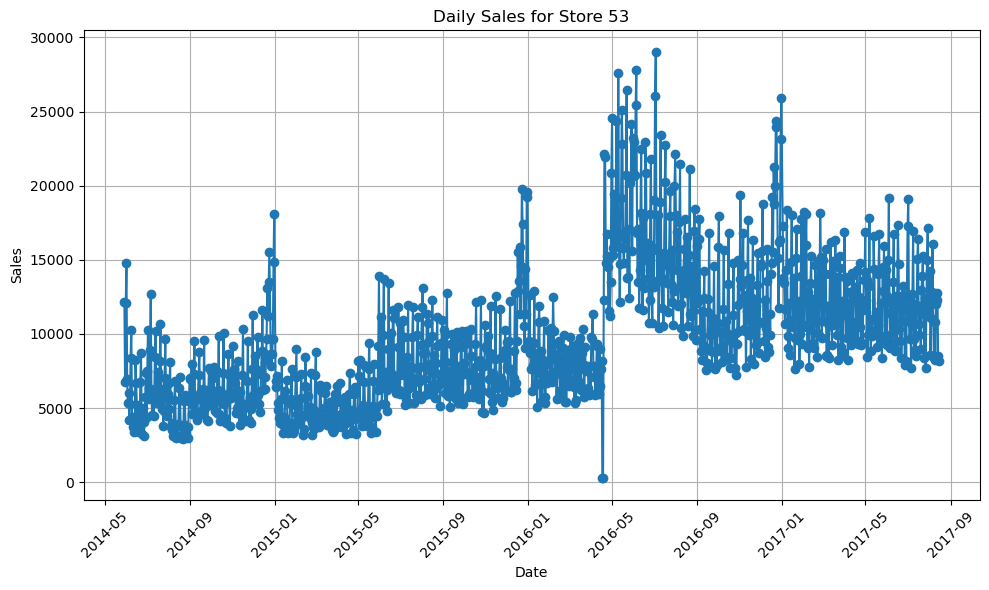

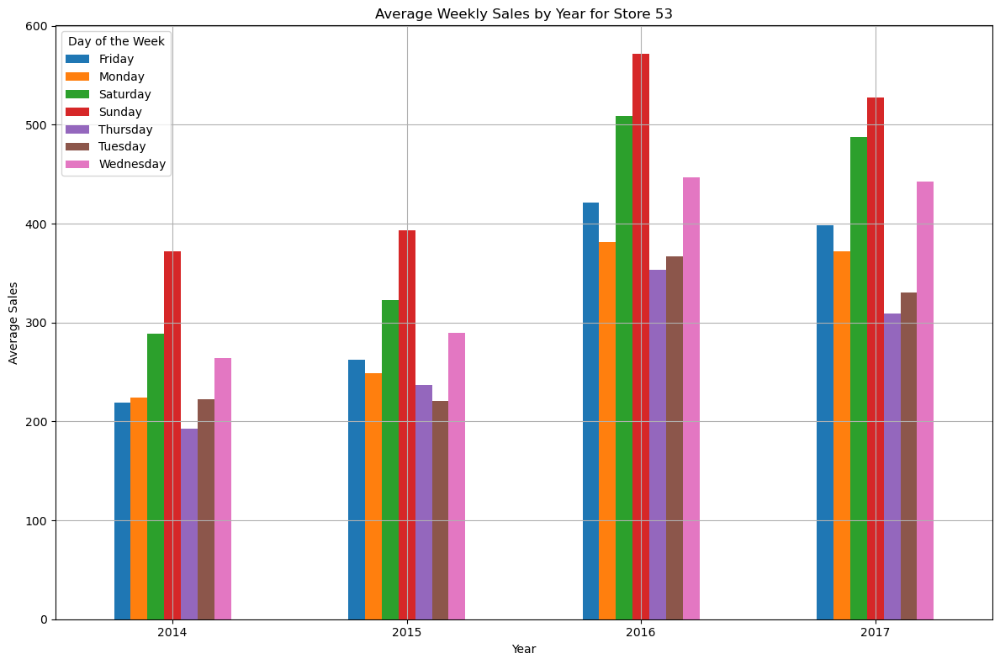

In [18]:
# store_nbr이 53인 데이터만 추출
df_store_53 = train[train['store_nbr'] == 53]
df_store_53 = df_store_53[df_store_53['sales'] != 0]

# 날짜별 sales의 합계 계산
date_sales_sum = df_store_53.groupby('date')['sales'].sum().reset_index()

# Line chart for sales over time
plt.figure(figsize=(10, 6))
plt.plot(date_sales_sum['date'], date_sales_sum['sales'], marker='o')
plt.title('Daily Sales for Store 53')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# 요일별 sales의 양을 연도별로 평균
df_store_53['date'] = pd.to_datetime(df_store_53['date'])
df_store_53['weekday'] = df_store_53['date'].dt.day_name()
df_store_53['year'] = df_store_53['date'].dt.year

weekday_sales_mean = df_store_53.groupby(['year', 'weekday'])['sales'].mean().unstack()

# Bar chart for average weekly sales by year
weekday_sales_mean.plot(kind='bar', figsize=(12, 8))
plt.title('Average Weekly Sales by Year for Store 53')
plt.xlabel('Year')
plt.ylabel('Average Sales')
plt.xticks(rotation=0)
plt.legend(title='Day of the Week')
plt.grid(True)
plt.tight_layout()
plt.show()

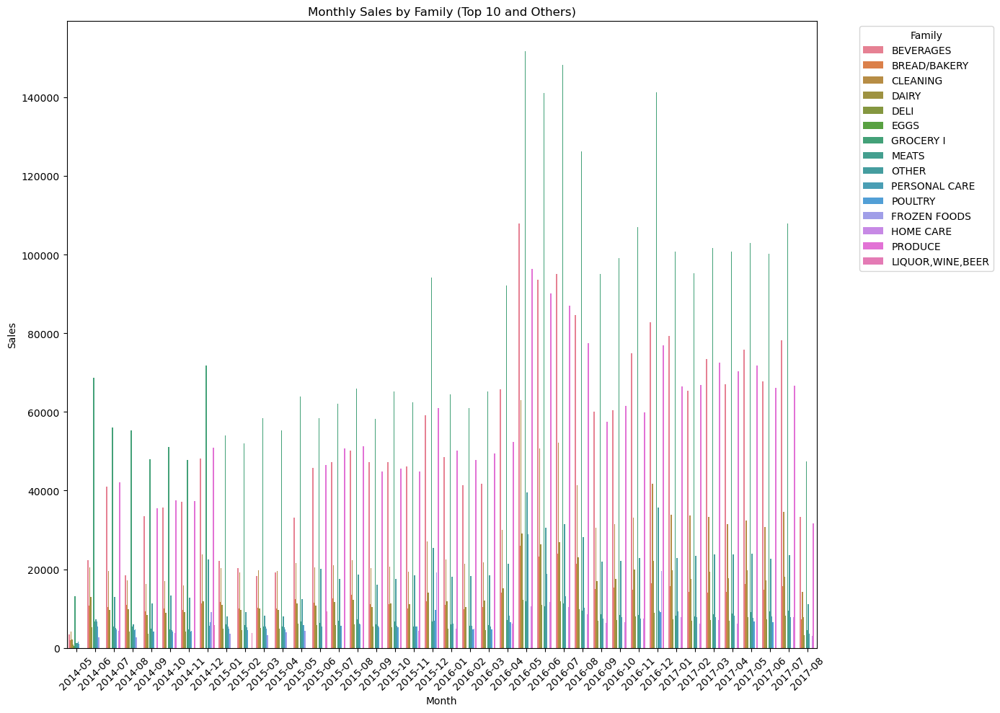

In [27]:
# store_nbr이 53인 데이터만 추출
df_store_53 = train[train['store_nbr'] == 53]

# sales가 0인 데이터 제거
df_store_53 = df_store_53[df_store_53['sales'] != 0]

# 날짜 형식을 datetime으로 변환
df_store_53['date'] = pd.to_datetime(df_store_53['date'])

# 월별로 변환
df_store_53['month'] = df_store_53['date'].dt.to_period('M')

# 월별 family 별 sales 합계 계산
monthly_sales = df_store_53.groupby(['month', 'family'])['sales'].sum().reset_index()

# 각 월별로 상위 10개 family와 나머지 그룹핑
def categorize_family(group):
    top_families = group.nlargest(10, 'sales')['family']
    group['family'] = group['family'].apply(lambda x: x if x in top_families.values else 'OTHER')
    return group

monthly_sales_grouped = monthly_sales.groupby('month', group_keys=False).apply(categorize_family)

# 그룹화된 데이터로 월별 family 별 sales 합계 재계산
monthly_sales_grouped = monthly_sales_grouped.groupby(['month', 'family'])['sales'].sum().reset_index()

# 막대그래프 그리기
plt.figure(figsize=(14, 10))
sns.barplot(data=monthly_sales_grouped, x='month', y='sales', hue='family')
plt.title('Monthly Sales by Family (Top 10 and Others)')
plt.xlabel('Month')
plt.ylabel('Sales')
plt.xticks(rotation=45)
plt.legend(title='Family', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [61]:
a = train.set_index("date").groupby("family").resample("D").sales.sum().reset_index()
px.line(a, x = "date", y= "sales", color = "family", title = "Daily total sales of the family")

In [62]:
a = train.groupby("family").sales.mean().sort_values(ascending = False).reset_index()
px.bar(a, y = "family", x="sales", color = "family", title = "Which product family preferred more?")

## Transaction Preprocessing

In [14]:
transactions["date"] = pd.to_datetime(transactions.date)
transactions.head()

,date,store_nbr,transactions
1,2013-01-02,1,2111
47,2013-01-03,1,1833
93,2013-01-04,1,1863
139,2013-01-05,1,1509
185,2013-01-06,1,520


In [15]:
duplicated_dates = transactions[transactions.duplicated(subset='date', keep=False)]

print(duplicated_dates)

            date  store_nbr  transactions
1     2013-01-02          1          2111
47    2013-01-03          1          1833
93    2013-01-04          1          1863
139   2013-01-05          1          1509
185   2013-01-06          1           520
...          ...        ...           ...
83271 2017-08-11         54           768
83325 2017-08-12         54           903
83379 2017-08-13         54          1054
83433 2017-08-14         54           818
83487 2017-08-15         54           802

[83485 rows x 3 columns]


In [16]:
grouped_df = transactions.groupby(['date', 'store_nbr'], as_index=False)['transactions'].sum()

print(grouped_df)

            date  store_nbr  transactions
0     2013-01-01         25           770
1     2013-01-02          1          2111
2     2013-01-02          2          2358
3     2013-01-02          3          3487
4     2013-01-02          4          1922
...          ...        ...           ...
83483 2017-08-15         50          2804
83484 2017-08-15         51          1573
83485 2017-08-15         52          2255
83486 2017-08-15         53           932
83487 2017-08-15         54           802

[83488 rows x 3 columns]


In [17]:
min_date = transactions['date'].min()
max_date = transactions['date'].max()

# 전체 기간 생성 및 비어 있는 날짜 찾기
all_dates = pd.date_range(start=min_date, end=max_date)
missing_dates = all_dates.difference(pd.to_datetime(transactions['date'].unique()))

print("Start Date:", min_date)
print("End Date:", max_date)
print("Missing Dates:", missing_dates)

Start Date: 2013-01-01 00:00:00
End Date: 2017-08-15 00:00:00
Missing Dates: DatetimeIndex(['2013-12-25', '2014-12-25', '2015-12-25', '2016-01-01',
               '2016-01-03', '2016-12-25'],
              dtype='datetime64[ns]', freq=None)


## transaction EDA

In [18]:
temp = pd.merge(train.groupby(["date", "store_nbr"]).sales.sum().reset_index(), transactions, how = "left")
temp = temp.dropna(subset=['transactions'])
temp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 83488 entries, 24 to 90935
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          83488 non-null  datetime64[ns]
 1   store_nbr     83488 non-null  int64         
 2   sales         83488 non-null  float64       
 3   transactions  83488 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1)
memory usage: 3.2 MB


In [19]:
temp.head()

,date,store_nbr,sales,transactions
24,2013-01-01,25,2511.62,770.00
54,2013-01-02,1,7417.15,2111.00
55,2013-01-02,2,10266.72,2358.00
56,2013-01-02,3,24060.35,3487.00
57,2013-01-02,4,10200.08,1922.00


In [20]:
print("Spearman Correlation between Total Sales and Transactions: {:,.4f}".format(temp.corr("spearman").sales.loc["transactions"]))
px.line(transactions.sort_values(["store_nbr", "date"]), x='date', y='transactions', color='store_nbr',title = "Transactions" )

Spearman Correlation between Total Sales and Transactions: 0.8175


In [21]:
a = transactions.copy()
a["year"] = a.date.dt.year
a["month"] = a.date.dt.month
px.box(a, x="year", y="transactions" , color = "month", title = "Transactions")

In [22]:
a = transactions.set_index("date").resample("M").transactions.mean().reset_index()
a["year"] = a.date.dt.year
px.line(a, x='date', y='transactions', color='year',title = "Monthly Average Transactions" )

In [24]:
px.scatter(temp, x = "transactions", y = "sales", trendline = "ols", trendline_color_override = "red")

### 일주일 간의 거래건수 표시

In [31]:
a = transactions.copy()
a["year"] = a.date.dt.year
a["dayofweek"] = a.date.dt.dayofweek+1 # monday 0->1
a = a.groupby(["year", "dayofweek"]).transactions.mean().reset_index()
px.line(a, x="dayofweek", y="transactions" , color = "year", title = "Transactions of Week")

### Holidays_events preprocessing


In [39]:
holidays_events = pd.read_csv("../data//holidays_events.csv")
holidays_events.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [40]:
holidays_events["date"] = pd.to_datetime(holidays_events.date)

In [41]:
holidays_events.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         350 non-null    datetime64[ns]
 1   type         350 non-null    object        
 2   locale       350 non-null    object        
 3   locale_name  350 non-null    object        
 4   description  350 non-null    object        
 5   transferred  350 non-null    bool          
dtypes: bool(1), datetime64[ns](1), object(4)
memory usage: 14.1+ KB


### Holday_event EDA

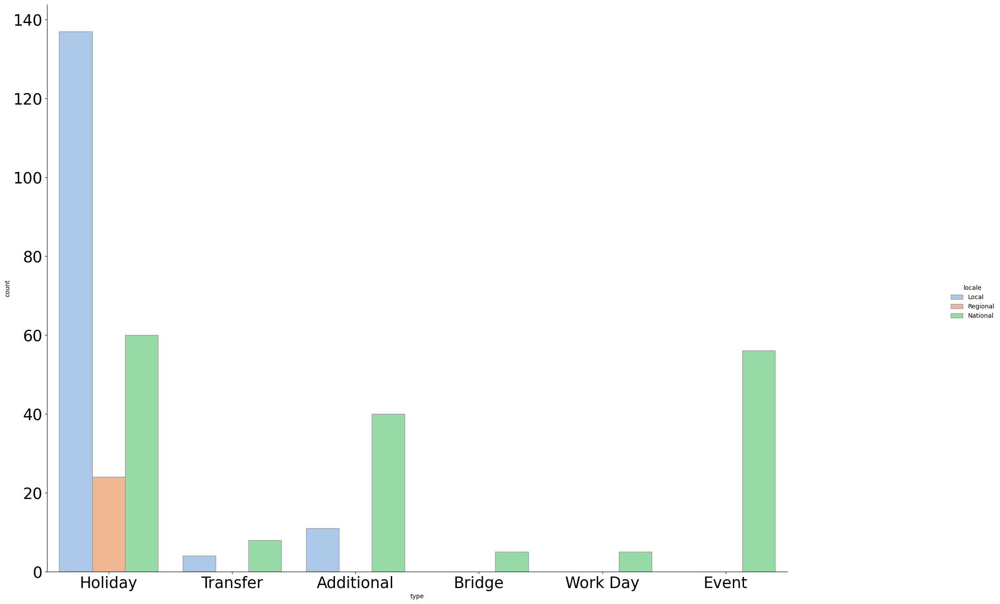

In [30]:
sns.catplot(x="type", hue="locale", kind="count", palette="pastel", edgecolor=".6", data=holidays_events)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)

plt.gcf().set_size_inches(25, 15)

### Oil Preprocessing

In [59]:
oil = pd.read_csv("../data/oil.csv")
oil["date"] = pd.to_datetime(oil.date)
# Resample
oil = oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()
# Interpolate
oil["dcoilwtico"] = np.where(oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"])
oil["dcoilwtico_interpolated"] =oil.dcoilwtico.interpolate()
# Plot
p = oil.melt(id_vars=['date']+list(oil.keys()[5:]), var_name='Legend')
px.line(p.sort_values(["Legend", "date"], ascending = [False, True]), x='date', y='value', color='Legend',title = "Daily Oil Price" )

# Feature Engineering

### train 데이터와 promotion 데이터 Merge

In [ ]:
data_pool = pd.merge(train, transactions, on=["date", "store_nbr"], how="left")


In [32]:
data_pool.head()

,id,date,store_nbr,family,sales,onpromotion,transactions
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,NaN
1,1,2013-01-01,1,BABY CARE,0.00,0.00,NaN
2,2,2013-01-01,1,BEAUTY,0.00,0.00,NaN
3,3,2013-01-01,1,BEVERAGES,0.00,0.00,NaN
4,4,2013-01-01,1,BOOKS,0.00,0.00,NaN


In [33]:
data_pool.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 7 columns):
 #   Column        Dtype         
---  ------        -----         
 0   id            int64         
 1   date          datetime64[ns]
 2   store_nbr     int64         
 3   family        object        
 4   sales         float32       
 5   onpromotion   float16       
 6   transactions  float64       
dtypes: datetime64[ns](1), float16(1), float32(1), float64(1), int64(2), object(1)
memory usage: 131.6+ MB


In [34]:
missing_transactions = data_pool['transactions'].isnull().sum()
print("Missing Transactions:", missing_transactions)

Missing Transactions: 245784


In [35]:
data_pool['transactions'].fillna(0.0, inplace=True)
data_pool['transactions'] = data_pool['transactions'].astype('float32')

data_pool.head()

,id,date,store_nbr,family,sales,onpromotion,transactions
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,0.00
1,1,2013-01-01,1,BABY CARE,0.00,0.00,0.00
2,2,2013-01-01,1,BEAUTY,0.00,0.00,0.00
3,3,2013-01-01,1,BEVERAGES,0.00,0.00,0.00
4,4,2013-01-01,1,BOOKS,0.00,0.00,0.00


In [38]:
data_pool.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 7 columns):
 #   Column        Dtype         
---  ------        -----         
 0   id            int64         
 1   date          datetime64[ns]
 2   store_nbr     int64         
 3   family        object        
 4   sales         float32       
 5   onpromotion   float16       
 6   transactions  float32       
dtypes: datetime64[ns](1), float16(1), float32(2), int64(2), object(1)
memory usage: 120.2+ MB


In [35]:
stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


In [ ]:
# 시간 피처
train['date'] = pd.to_datetime(train['date'])
train['year'] = train['date'].dt.year
train['month'] = train['date'].dt.month
train['day'] = train['date'].dt.day
train['weekday'] = train['date'].dt.weekday

# 지연 피처
train['lag_sales_1'] = train['sales'].shift(1)
train['rolling_avg_sales_3'] = train['sales'].rolling(window=3).mean()

# 휴일 효과
train = train.merge(holidays_events, on='date', how='left')
train['is_holiday'] = train['type'].notnull().astype(int)

# 매장 속성
stores_dummies = pd.get_dummies(stores[['type', 'city']], drop_first=True)
stores = stores.join(stores_dummies)

# 매장 정보를 훈련 데이터에 병합
train = train.merge(stores, on='store_nbr', how='left')

In [48]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split


# 데이터 병합
train = train.merge(transactions, on=['date', 'store_nbr'], how='left')
train = train.merge(stores, on='store_nbr', how='left')
train = train.merge(holidays_events, on='date', how='left', suffixes=('', '_hol'))

# 결측치 처리
train.fillna({'transactions': 0, 'type_hol': 'No Holiday', 'transferred': False}, inplace=True)

# 범주형 변수 인코딩
train = pd.get_dummies(train, columns=['family', 'city', 'state', 'type', 'cluster', 'type_hol', 'locale', 'locale_name'], drop_first=True)


## Feature Importance

In [49]:
from sklearn.ensemble import RandomForestRegressor

# 타겟 변수와 피처 분리
X = train.drop(['id', 'date', 'sales', 'description', 'transferred'], axis=1)
y = train['sales']

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# 모델 학습
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# 피처 중요도 출력
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

for i in indices[:10]:  # 상위 10개 피처
    print(f"{X_train.columns[i]}: {importances[i]:.3f}")



transactions: 0.358
family_GROCERY I: 0.301
family_BEVERAGES: 0.117
onpromotion: 0.072
family_PRODUCE: 0.035
family_CLEANING: 0.022
store_nbr: 0.021
family_DAIRY: 0.009
cluster_14: 0.006
type_hol_Event: 0.004


## Recursive Feature Elimination, RFE

In [38]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFECV
from sklearn.preprocessing import StandardScaler

train = pd.read_csv("../data/temp.csv")

# sales가 0인 데이터 제거 (예시 데이터에서는 모두 0이므로 실제 데이터를 사용할 때 유용)
train = train[train['sales'] != 0]

# 날짜 형식을 datetime으로 변환
train['date'] = pd.to_datetime(train['date'])

# 피처 선택을 위한 데이터 전처리
X = train.drop(['date', 'sales'], axis=1)
X = pd.get_dummies(X, columns=['family', 'city', 'state', 'type', 'day_of_week', 'year', 'month', 'day'], drop_first=True)
y = train['sales']

# 정규화
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습 및 테스트 데이터 분리
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# RFE 모델 생성 및 학습
rfe = RFECV(estimator=RandomForestRegressor(n_estimators=50, random_state=42), step=1, cv=3, scoring='neg_mean_squared_error')
rfe.fit(X_train, y_train)

# 선택된 피처 출력
selected_features = X_train.columns[rfe.support_]
print("Selected features:", selected_features)


In [ ]:
# 최적의 피처만 사용하여 모델 재학습 및 평가
X_train_opt = rfe.transform(X_train)
X_test_opt = rfe.transform(X_test)

rf_opt = RandomForestRegressor(n_estimators=100, random_state=42)
rf_opt.fit(X_train_opt, y_train)

# 성능 평가
y_pred = rf_opt.predict(X_test_opt)
mse = mean_squared_error(y_test, y_pred)
print(f'Test MSE: {mse:.3f}')